In [1]:
import numpy as np
import pandas as pd
import math as m
import matplotlib.pyplot as plt
import glob

In [9]:
data = pd.read_csv('C:/Users/ale/Documents/Tec/SPHEREdata/train/00001/acceleration.csv')
df = pd.DataFrame(data, columns=['t','x','y','z'])
df.head()

,t,x,y,z
0,0.017856,0.944,-0.280,0.152
1,0.067904,0.944,-0.292,0.156
2,0.117952,0.946,-0.286,0.156
3,0.168000,0.942,-0.288,0.160
4,0.217856,0.946,-0.286,0.158


In [10]:
activity0 = pd.read_csv('C:/Users/ale/Documents/Tec/SPHEREdata/train/00001/annotations_0.csv')
activity0.head()

,start,end,name,index
0,45.930,49.730,a_walk,4
1,49.843,53.886,t_turn,19
2,53.958,58.727,p_stand,10
3,58.821,60.821,t_turn,19
4,60.892,61.240,p_stand,10


In [11]:
def merge_annotations(data, annotations, column_name):
    data[column_name] = 0
    for i in range(len(data)):
        for j in range(len(annotations)):
            if data['t'][i] > activity0['start'][j] and data['t'][i] < activity0['end'][j]:
                data[column_name][i] = activity0['name'][j]
    return data 

In [12]:
newData = merge_annotations(df, activity0, 'annotation0')

<ipython-input-11-028b8110d78b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column_name][i] = activity0['name'][j]
C:\Users\ale\anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [13]:
pd.set_option("display.max_rows", None)
newData

,t,x,y,z,annotation0
0,0.017856,0.944,-0.280,0.152,0
1,0.067904,0.944,-0.292,0.156,0
2,0.117952,0.946,-0.286,0.156,0
3,0.168000,0.942,-0.288,0.160,0
4,0.217856,0.946,-0.286,0.158,0
5,0.267904,0.936,-0.274,0.142,0
6,0.317952,0.944,-0.282,0.144,0
7,0.368000,0.896,-0.290,0.134,0
8,0.417856,0.940,-0.282,0.144,0
9,0.467904,0.928,-0.276,0.150,0


In [7]:
def sleep_windows(data):
    for i in range(len(newData)):
        if data['annotation0'][i] == 'p_lie':
            pass
        else:
            data = data.drop([i])
    data = data.reset_index()
    return data

In [8]:
sleepData = sleep_windows(newData)
sleepData.head()

,index,t,x,y,z,annotation0
0,3249,183.876856,-0.282,0.230,0.998,p_lie
1,3250,183.926904,-0.366,0.270,0.944,p_lie
2,3251,183.976952,-0.354,0.126,0.888,p_lie
3,3252,184.027000,-0.328,0.028,0.950,p_lie
4,3287,185.778952,0.126,0.600,1.102,p_lie


In [118]:
def arm_angle(df):
    arm_angles = []
    for i in range(len(df)):
        omega = df['z'][i]/(m.sqrt(df['x'][i]**2 + df['y'][i]**2))
        angle = (m.atan(omega))*(180/m.pi)
        arm_angles.append(angle)
    df['arm_angle'] = arm_angles
    return df

def change(df):
    change = []
    for i in range(len(df)):
        try:
            delta = df['arm_angle'][i] - df['arm_angle'][i-1]
            change.append(delta)
        except KeyError:
            change.append(np.nan)
    df['change'] = change
    return df

In [119]:
d = arm_angle(sleepData)
finalData = change(d)
finalData = finalData.drop(['index'], axis=1)

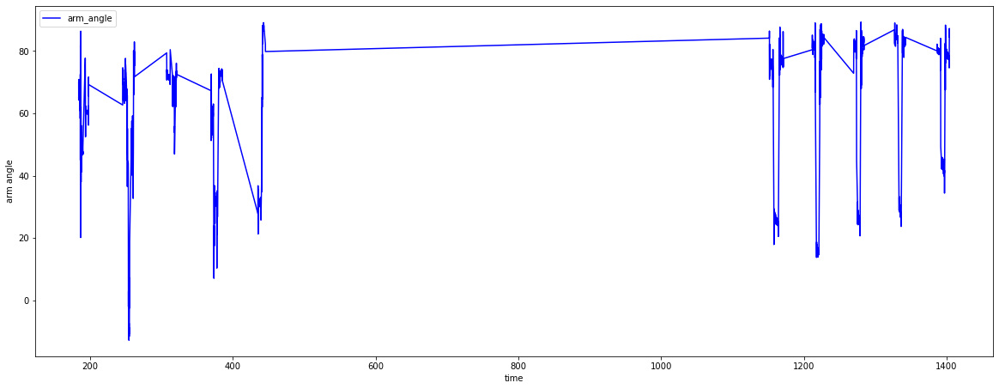

In [120]:
plt.figure(figsize=(20, 7.5))
plt.plot(finalData['t'], finalData['arm_angle'], label='arm_angle', color='b')
plt.xlabel('time')
plt.ylabel('arm angle')
plt.legend()
plt.show()

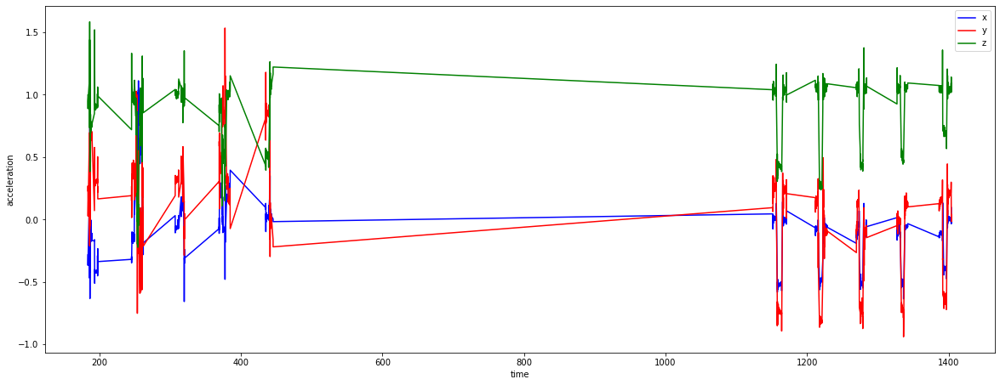

In [121]:
plt.figure(figsize=(20, 7.5))
plt.plot(finalData['t'], finalData['x'], label='x', color='b')
plt.plot(finalData['t'], finalData['y'], label='y', color='r')
plt.plot(finalData['t'], finalData['z'], label='z', color='g')

plt.xlabel('time')
plt.ylabel('acceleration')
plt.legend()
plt.show()

In [122]:
finalData

,t,x,y,z,annotation0,arm_angle,change
0,183.876856,-0.282,0.230,0.998,p_lie,69.966610,NaN
1,183.926904,-0.366,0.270,0.944,p_lie,64.275477,-5.691133
2,183.976952,-0.354,0.126,0.888,p_lie,67.064456,2.788979
3,184.027000,-0.328,0.028,0.950,p_lie,70.887832,3.823377
4,185.778952,0.126,0.600,1.102,p_lie,60.911039,-9.976793
5,185.829000,-0.214,0.252,0.782,p_lie,67.082856,6.171817
6,185.878856,0.342,0.396,1.216,p_lie,66.717985,-0.364871
7,185.928904,-0.288,0.258,0.786,p_lie,63.805711,-2.912274
8,185.978952,0.126,0.432,1.116,p_lie,68.039436,4.233725
9,186.029000,-0.398,0.488,1.030,p_lie,58.559252,-9.480184


In [123]:
#finalData[0:888].to_csv('C:/Users/ale/Documents/Tec/sleep_episodes/00010/sleep_1.csv', index = False)
#finalData[888:].to_csv('C:/Users/ale/Documents/Tec/sleep_episodes/00010/sleep_2.csv', index = False)